# Deep kernel learning for band excitation piezoresponse spectroscopy

*   PTO sample from Funakubo
*   BEPS and DKL notebook by Yongtao Liu
*   Data acquisition is simulated with [`mexpsimu`](https://pypi.org/project/mexpsimu/): a recorded PTO BEPS
    dataset is played back through the same three operations a real acquisition loop uses
    (**image scan**, **move tip**, **spectroscopy**). No raw data file is loaded directly in this notebook.
*   Deep kernel learning uses [**ENGAGEGP**](https://github.com/yongtaoliu/ENGAGEGP) (`engage-gp`): a PyTorch/GPyTorch
    deep kernel GP, replacing the JAX-based `gpax` implementation.


## Installation


In [ ]:
!pip install -q engage-gp   # ENGAGE: deep kernel GP regression, classification and preference learning
!pip install -q mexpsimu    # microscopy experiment simulator (image scan / move tip / spectroscopy)
# For local checkouts instead of PyPI:
# !pip install -e /path/to/ENGAGEGP
# !pip install -e /path/to/mexpsimu


## Imports


In [2]:
from warnings import filterwarnings

import numpy as np
import matplotlib.pyplot as plt
import torch
from scipy.stats import norm as normal_dist

from engagegp import fit_dkgp
from engagegp.utils import get_grid_coords, get_subimages   # image patch utilities

import mexpsimu

filterwarnings("ignore", category=UserWarning)
np.random.seed(42)
torch.manual_seed(42)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("device:", DEVICE)


C:\Users\yla\AppData\Local\Temp\claude\C--Users-yla\f50f2ee4-9c2a-4908-9b1a-c6c105dc90e6\scratchpad\testenv\Lib\site-packages\torch\jit\_script.py:1491: FutureWarning: `torch.jit.script` is deprecated. Please switch to `torch.compile` or `torch.export`.
  warnings.warn(


C:\Users\yla\AppData\Local\Temp\claude\C--Users-yla\f50f2ee4-9c2a-4908-9b1a-c6c105dc90e6\scratchpad\testenv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


device: cpu


## Connect to the (simulated) microscope

`mexpsimu` bundles three PTO BEPS datasets (`PTO_BEPS_1d3um`, `PTO_BEPS_1d7um`, `PTO_BEPS_3um`), named by their physical
scan size. Each one is exposed through a `Microscope` object with three operations:

*   `scope.scan_image(channel)` -- full-frame image scan
*   `scope.move_tip(x, y)` -- move the probe tip (microns, or pixels with `units="px"`)
*   `scope.spectroscopy(x, y)` -- local piezoresponse loop at the tip position, paired with the recorded DC bias waveform

The spectra returned by `spectroscopy()` are already the (off-field) piezoresponse loops, so the SHO-fit / phase-correction
steps of the original notebook are not needed here. We use `PTO_BEPS_1d7um`, which is the same 1.7 um PTO scan as the
`BEPS_1d7um_0009.h5` file the original notebook downloaded (100 x 100 grid, 256 voltage steps). Change `PRESET` to try the others.


In [3]:
print("available presets:", mexpsimu.list_presets())

PRESET = "PTO_BEPS_1d7um"   # 1.7 um PTO scan: 100x100 spectroscopy grid, 256 voltage steps (8 bipolar +-12 V cycles)
scope = mexpsimu.Microscope(PRESET)

print(scope)
print("image channels:", scope.list_channels())
print("voltage source:", scope.voltage_source)


available presets: ['PTO_BEPS_1d3um', 'PTO_BEPS_1d7um', 'PTO_BEPS_3um', 'artificial_defect_cAFM']
Microscope(dataset='PTO_BEPS_1d7um', image_shape=(100, 100), measurement_shape=(100, 100), position=TipPosition(row=50, col=50, x_um=0.8585858585858586, y_um=0.8585858585858586))
image channels: ['image', 'image2']
voltage source: recorded


### Image scan

`image` is the structural (PFM amplitude / topography) channel; `image2` is a derived mean-response map.
The excitation waveform is the DC bias actually applied at every spectroscopy step.


Text(0.5, 1.0, 'Excitation waveform (256 steps)')

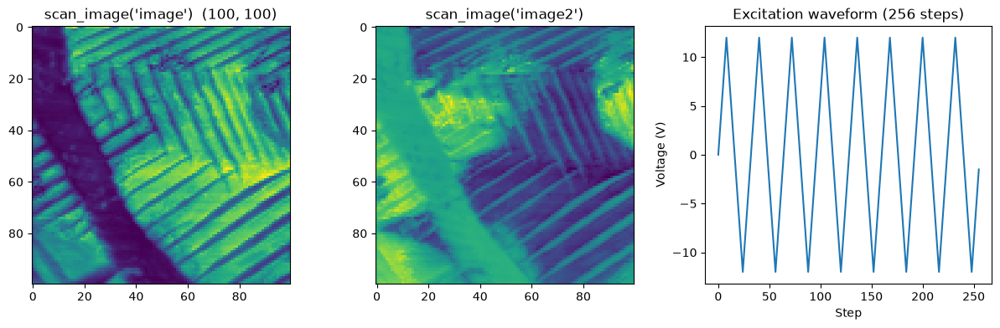

In [4]:
struc_img_full = scope.scan_image("image")    # structure image of the whole frame
resp_img_full = scope.scan_image("image2")    # mean piezoresponse map
v_step = scope.excitation_waveform            # DC bias (V) at each spectroscopy step

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
ax1.imshow(struc_img_full)
ax1.set_title(f"scan_image('image')  {struc_img_full.shape}")
ax2.imshow(resp_img_full)
ax2.set_title("scan_image('image2')")
ax3.plot(v_step)
ax3.set_xlabel('Step')
ax3.set_ylabel('Voltage (V)')
ax3.set_title(f'Excitation waveform ({len(v_step)} steps)')


Generate training inputs (image patches) from the image scan. Spectra (the targets) are measured on demand.
ENGAGEGP ships the patch-extraction helpers (`get_grid_coords`, `get_subimages`), so `atomai` is no longer needed.


In [7]:
norm_ = lambda x: (x - x.min()) / np.ptp(x)


In [ ]:
img = norm_(struc_img_full)

coordinates = get_grid_coords(img, step=1)      # all (row, col) positions

# extract subimage for each point on a grid
window_size = 16
features_all, coords, _ = get_subimages(img, coordinates, window_size)
features_all = features_all[:,:,:,0]            # drop the channel axis -> (N, 16, 16)
coords = np.array(coords, dtype=int)            # (row, col) of each patch centre in the ROI
grid_shape = (img.shape[0] - window_size + 1, img.shape[1] - window_size + 1)

print(coords.shape)
print(features_all.shape)
print('patch grid:', grid_shape)


(2025, 2)
(2025, 16, 16)
patch grid: (45, 45)


Normalize the image patches:


In [ ]:
features = norm_(features_all)

### Scalarizer
Next, we select a scalarizer function that will convert a measured spectrum into a scalar physical descriptor.
Here it is a hysteresis-loop-area proxy: the difference between the response summed over the descending-bias branches
and over the ascending-bias branches. It uses the recorded excitation waveform, so it works for any number of
bipolar cycles (the original notebook hard-coded a 3-cycle sweep; `PTO_BEPS_1d7um` uses 8 cycles).


In [ ]:
def loop_area(response, voltage):
    dv = np.gradient(voltage)
    loop_top = response[dv < 0]      # descending-bias branches
    loop_bottom = response[dv > 0]   # ascending-bias branches
    return np.abs(np.sum(loop_top) - np.sum(loop_bottom))



loop area at patch 100 : 0.12800477629807383


### Ground-truth reference map (validation only)

To judge the DKL predictions later, we perform an exhaustive spectroscopy sweep over every patch centre, i.e. a full
BEPS map of the ROI. This is exactly the expensive measurement DKL is meant to avoid, so `loop_areas_ref` is used
**only for comparison plots**, never for training. The sweep is removed from `acquisition_log` afterwards so the
log reflects the actual experiment.


2025 reference spectra acquired


(np.float64(-0.5), np.float64(59.5), np.float64(-0.5), np.float64(59.5))

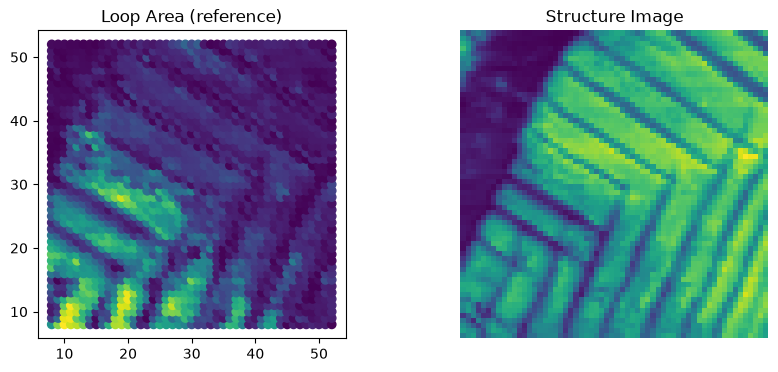

In [12]:
loop_areas_ref = np.array([loop_area(measure_spectrum(r, c), v_step) for r, c in coords])
print(f'{len(loop_areas_ref)} reference spectra acquired')
acquisition_log.clear()

# Plot the scalarized reference map
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 4))
ax1.scatter(coords[:, 1], coords[:, 0], c=loop_areas_ref)
ax1.set_title('Loop Area (reference)')
ax1.set_aspect('equal')

ax2.imshow(struc_img, origin = "lower")
ax2.set_title('Structure Image')
ax2.axis("off")


## Deep kernel GP with ENGAGEGP

`engagegp.fit_dkgp` trains a neural feature extractor jointly with a GP on top of the learned features.
It returns `(mll, gp_model, dkl_model, losses)`.

### A note on prediction

The convenience wrapper `engagegp.predict_dkgpr` calls the model's `forward` (`model(X)`), which evaluates the
GPyTorch module directly. Because `DeepKernelGP` stores its training inputs already passed through the GP's
`Normalize` input transform, that path transforms the test features a second time and conditions on training
points that live in a different space, so its predictions do not track the training targets. The BoTorch
`posterior()` API applies the transforms consistently, so `dkgp_predict` below uses it and then undoes the
(unused) `Standardize` outcome transform to return values on the same scale as `y`.

Replace `dkgp_predict` with `predict_dkgpr` once that is fixed upstream; everything else in this notebook is
the documented ENGAGEGP API.


In [13]:
def dkgp_predict(dkl, X_query, batch_size=2048):
    """Posterior mean and standard deviation of an ENGAGEGP model, on the scale of the training targets."""
    dkl.eval()
    X_query = np.asarray(X_query, dtype=np.float64)
    means, stds = [], []
    with torch.no_grad():
        for start in range(0, len(X_query), batch_size):
            batch = torch.from_numpy(X_query[start:start + batch_size]).double().to(DEVICE)
            posterior = dkl.gp_model.posterior(dkl.feature_extractor(batch))
            means.append(posterior.mean.squeeze(-1).cpu().numpy())
            stds.append(posterior.variance.squeeze(-1).sqrt().cpu().numpy())
    mean = np.concatenate(means)
    std = np.concatenate(stds)

    # undo the Standardize outcome transform, which the training loop bypasses
    outcome = dkl.gp_model.outcome_transform
    scale, offset = outcome.stdvs.item(), outcome.means.item()
    return (mean - offset) / scale, std / scale


def dkgp_embed(dkl, X_query, batch_size=2048):
    """The learned latent features (the deep kernel's embedding space)."""
    dkl.eval()
    X_query = np.asarray(X_query, dtype=np.float64)
    out = []
    with torch.no_grad():
        for start in range(0, len(X_query), batch_size):
            batch = torch.from_numpy(X_query[start:start + batch_size]).double().to(DEVICE)
            out.append(dkl.feature_extractor(batch).cpu().numpy())
    return np.concatenate(out)


def expected_improvement(mean, std, best_f, xi=0.01):
    """Expected improvement for maximization, from a posterior mean and standard deviation."""
    improvement = mean - best_f - xi
    z = improvement / (std + 1e-9)
    ei = improvement * normal_dist.cdf(z) + std * normal_dist.pdf(z)
    return np.where(std > 0, ei, 0.0)


## Reconstruction from partial data
Here we demonstrate how to use DKL to learn a correlative structure-property relationship from a relatively small number of image-(scalarized)spectrum pairs and then use the trained model to predict a targeted physical property for the entire image space.


Prepare data:


In [14]:
n, d1, d2 = features.shape
X = features.reshape(n, d1*d2)
indices_all = coords
X.shape, indices_all.shape


((2025, 256), (2025, 2))

We measure spectra only in a relatively small part of the ROI (below the dashed line in the figure below), train a DKL
model on those image-patch / loop-area pairs, and then use the trained model to predict the "unmeasured" loop areas for
the rest of the image:


315 spectroscopy measurements acquired for training


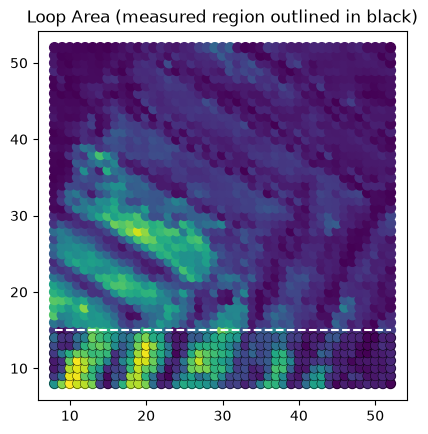

In [15]:
split_ = 15
train_mask = indices_all[:, 0] < split_
X_train = X[train_mask]
indices_train = indices_all[train_mask]

# Acquire the training spectra: move the tip to each training location and measure
y_train_raw = np.array([loop_area(measure_spectrum(r, c), v_step) for r, c in indices_train])
y_train = norm_(y_train_raw)
print(f'{len(y_train)} spectroscopy measurements acquired for training')

_, ax = plt.subplots(dpi=100)
ax.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=loop_areas_ref)
ax.scatter(indices_train[:, 1], indices_train[:, 0], s=50, c=y_train_raw, edgecolors='k', linewidths=0.3)
ax.hlines(split_, indices_all[:, 1].min(), indices_all[:, 1].max(), linestyle='--', color='w')
ax.set_title('Loop Area (measured region outlined in black)');
ax.set_aspect('equal')


Initialize and train a DKL model. `extractor_type='fcbn'` is ENGAGEGP's recommended default (fully connected
with batch normalization and dropout); `feature_dim=2` keeps the latent space two-dimensional so it can be
visualized directly.


Text(0.5, 1.0, 'DKL training loss')

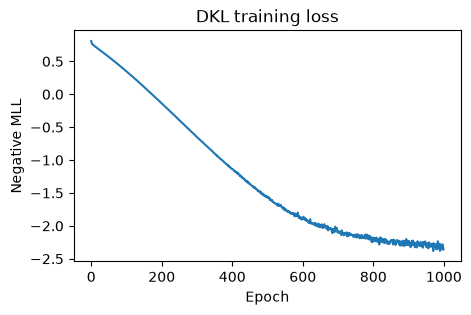

In [16]:
feature_dim = 2
extractor_type = 'fcbn'
num_epochs = 1000

torch.manual_seed(42)
mll, gp_model, dkl, losses = fit_dkgp(
    X_train, y_train,
    feature_dim=feature_dim,
    extractor_type=extractor_type,
    num_epochs=num_epochs,
    lr_features=1e-3,
    device=DEVICE,
    verbose=False,
)

plt.figure(figsize=(5, 3))
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Negative MLL')
plt.title('DKL training loss')


Use the trained model to make a probabilistic prediction for all the image patches and compare with the reference map:


correlation with reference, unmeasured region: 0.392


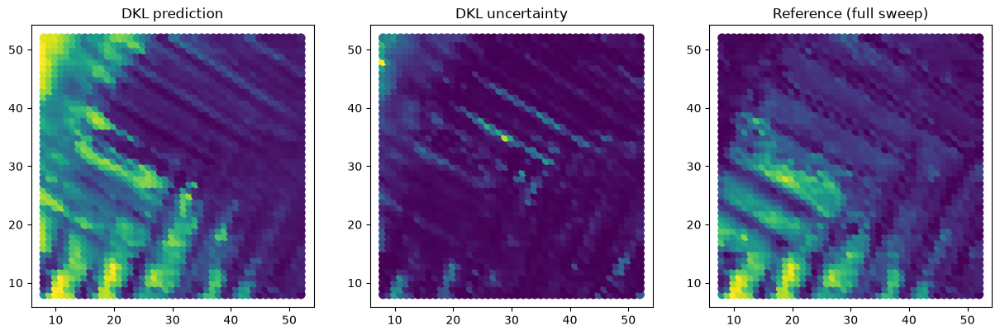

In [17]:
mean, std = dkgp_predict(dkl, X)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4.5), dpi=100)
ax1.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=mean)
ax1.set_title("DKL prediction")
ax2.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=std)
ax2.set_title("DKL uncertainty")
ax3.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=norm_(loop_areas_ref))
ax3.set_title("Reference (full sweep)")
for _ax in fig.axes:
    _ax.set_aspect('equal')

unmeasured = ~train_mask
print('correlation with reference, unmeasured region: %.3f'
      % np.corrcoef(mean[unmeasured], norm_(loop_areas_ref)[unmeasured])[0, 1])


We can also visualize the latent/embedding space:


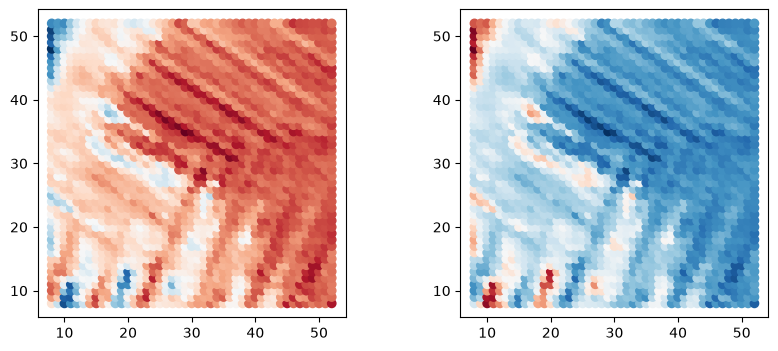

In [18]:
embeded = dkgp_embed(dkl, X)
embeded = embeded / np.abs(embeded).max()

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.scatter(indices_all[:, 1], indices_all[:, 0], c=embeded[:, 0], cmap='RdBu')
ax2.scatter(indices_all[:, 1], indices_all[:, 0], c=embeded[:, 1], cmap='RdBu')
for _ax in (ax1, ax2):
    _ax.set_aspect('equal')


## Active learning
Now we are going to use DKL to actively learn (local) structures where a particular physical behavior or property
(here, the hysteresis loop area) is maximized. Starting with just a few measured points, we use DKL to obtain the
predictive mean and variance for our property of interest over the entire image, use them to compute an acquisition
function (expected improvement, EI) and pick the next location, then **move the tip there and perform the spectroscopy
measurement on the microscope**.


Prepare the data


In [19]:
n, d1, d2 = features.shape
X = features.reshape(n, d1*d2)

exploration_steps = 100
testsize = 5

acquisition_log.clear()   # start counting measurements for this experiment
X.shape


(2025, 256)

Get the initial measurements aka training points. Here ```X_measured``` are the already measured points, that is, the
image patches for which spectra have been measured, whose scalarized values are stored in ```y_measured```. The
```X_unmeasured``` are unmeasured points, that is, image patches for which there are yet no measured spectra (and hence
no ```y``` values).


In [20]:
#  initial training points: pick a few random locations and measure them
rng = np.random.default_rng(1)
seed_idx = rng.choice(len(X), size=testsize, replace=False)
unmeasured_mask = np.ones(len(X), dtype=bool)
unmeasured_mask[seed_idx] = False

X_measured, indices_measured = X[seed_idx], indices_all[seed_idx]
X_unmeasured, indices_unmeasured = X[unmeasured_mask], indices_all[unmeasured_mask]

y_measured = np.array([loop_area(measure_spectrum(r, c), v_step) for r, c in indices_measured])

seed_points = len(X_measured)
seed_points


5

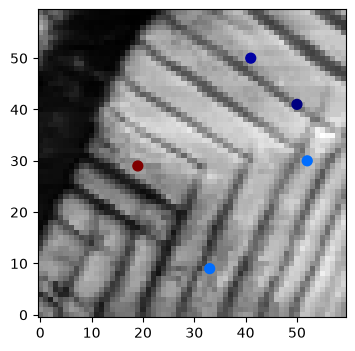

In [21]:
plt.figure(figsize=(4, 4))
plt.imshow(struc_img, origin = "lower", cmap = "gray")
plt.scatter(indices_measured[:, 1], indices_measured[:, 0], s=50, c=y_measured, cmap = 'jet')


Run the exploration. Each iteration re-trains the ENGAGEGP deep kernel GP, evaluates expected improvement over the unmeasured patches, and performs one new spectroscopy measurement on the (simulated) microscope:


In [22]:
def plot_result(indices, obj):
    plt.figure(figsize = (4, 4))
    plt.scatter(indices[:, 1], indices[:, 0], s=10, c=obj)
    next_point = indices[obj.argmax()]
    plt.scatter(next_point[1], next_point[0], s=10, marker='x', c='k')
    plt.xticks([])
    plt.yticks([])
    plt.title("Acquisition Values")
    plt.show()


1/100


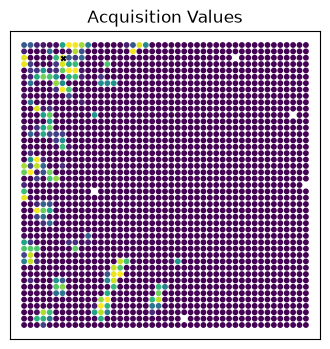

2/100


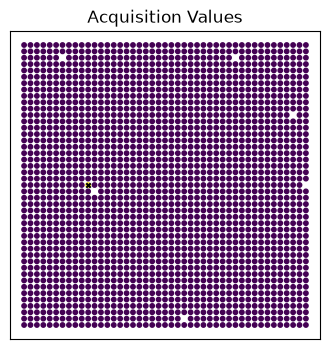

3/100


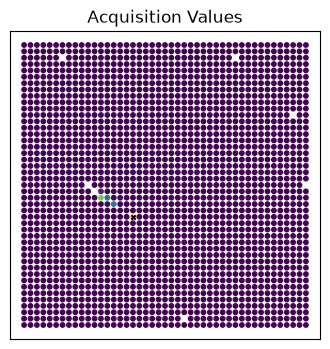

4/100


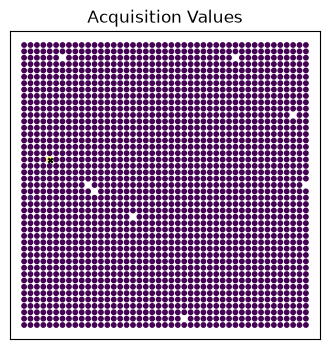

5/100


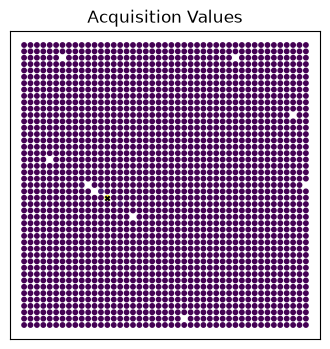

6/100


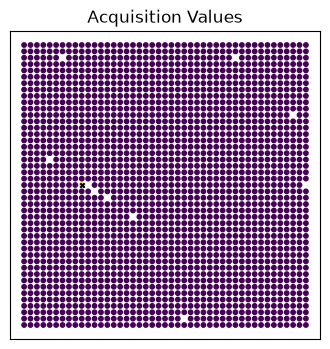

7/100


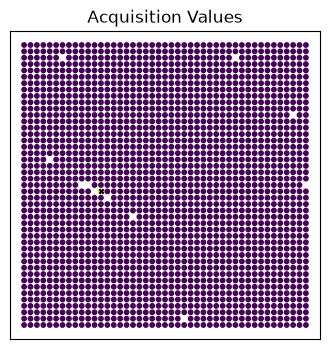

8/100


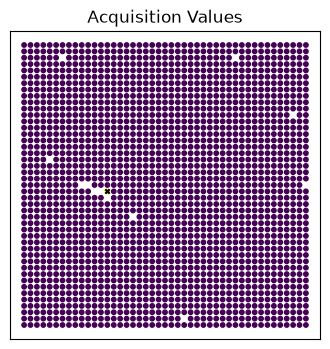

9/100


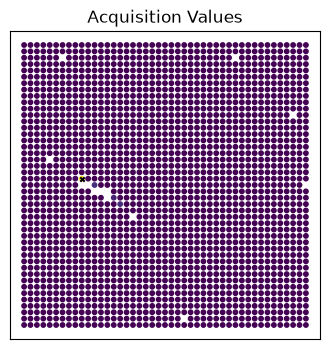

10/100


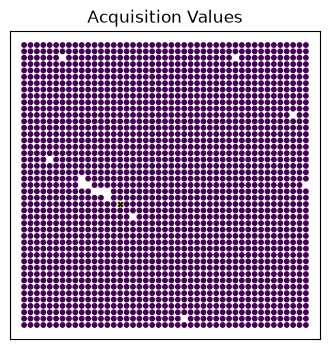

11/100


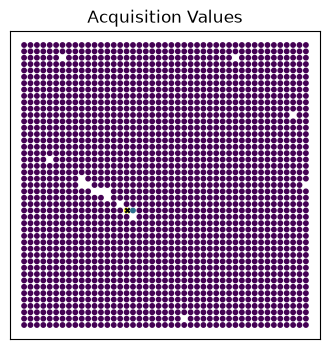

12/100


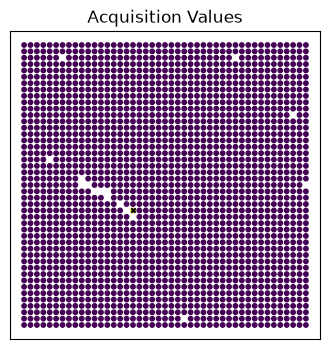

13/100


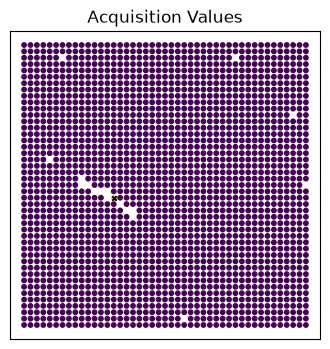

14/100


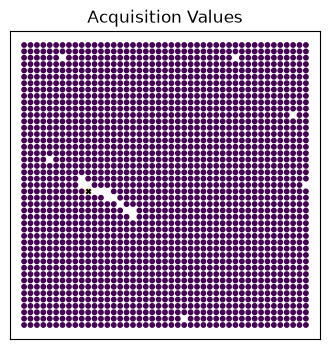

15/100


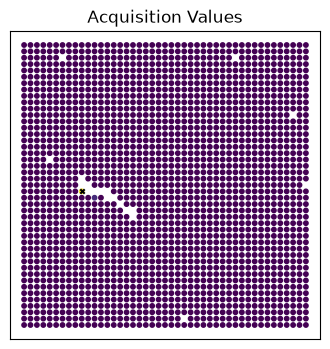

16/100


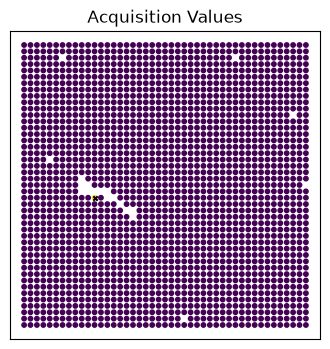

17/100


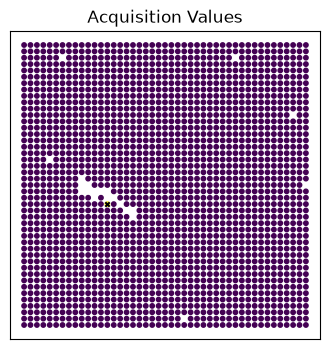

18/100


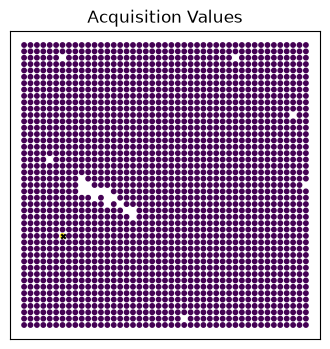

19/100


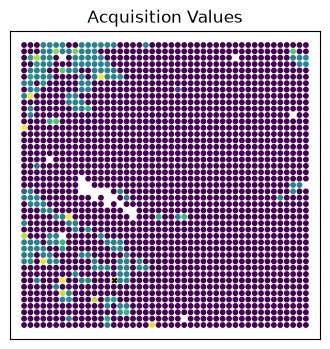

20/100


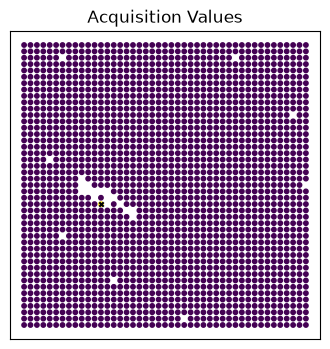

21/100


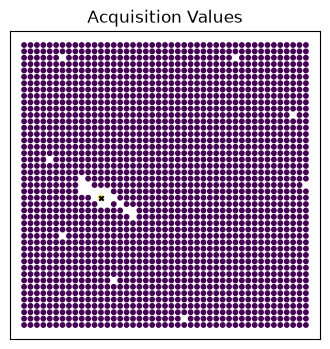

22/100


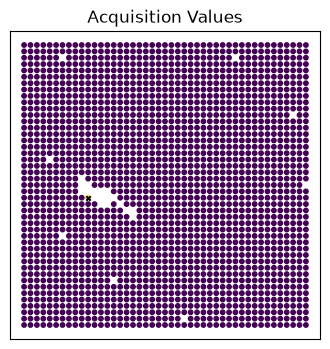

23/100


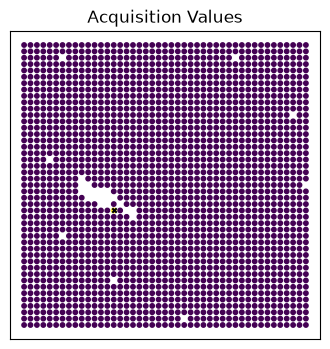

24/100


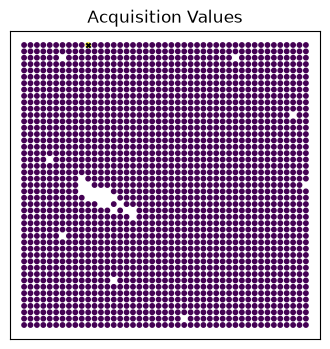

25/100


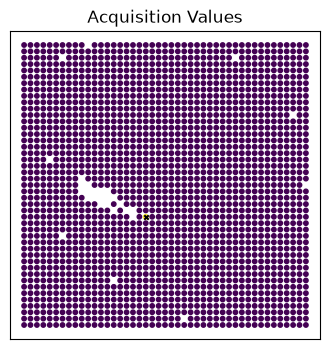

26/100


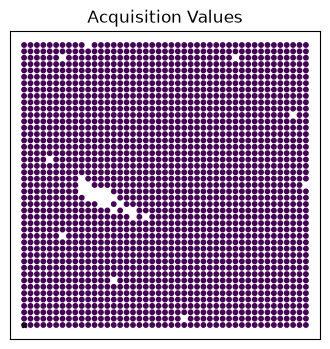

27/100


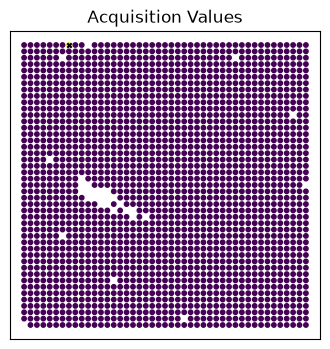

28/100


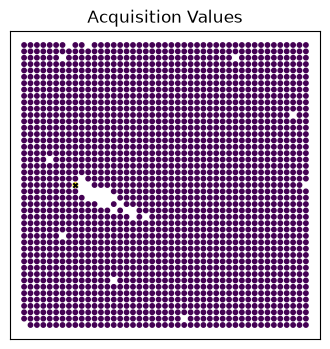

29/100


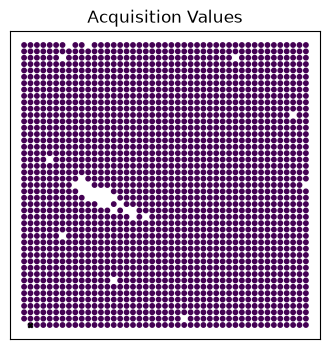

30/100


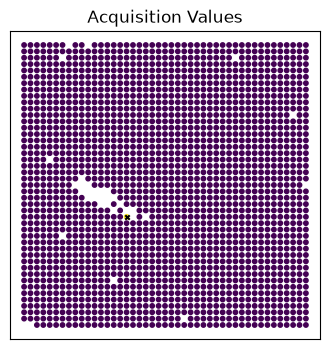

31/100


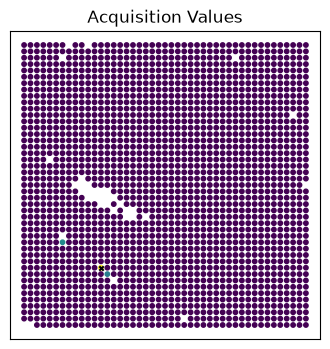

32/100


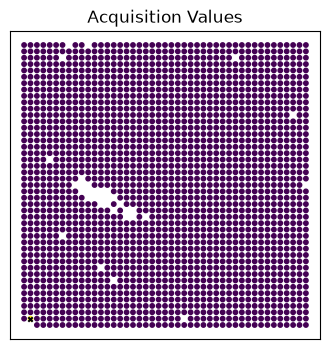

33/100


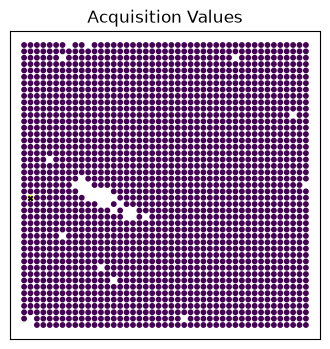

34/100


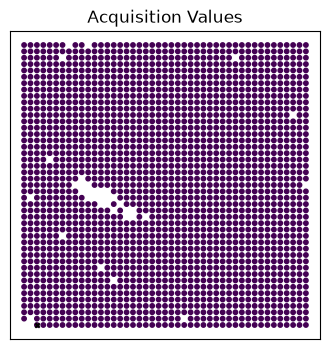

35/100


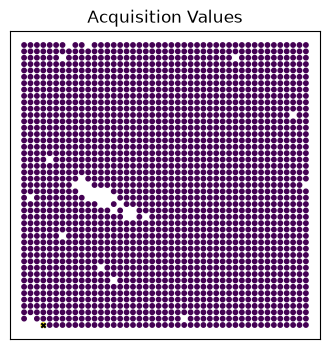

36/100


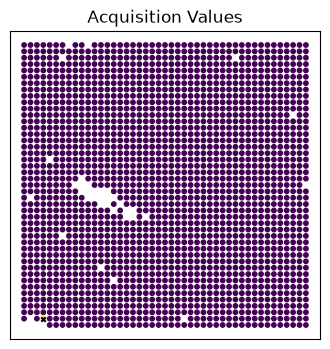

37/100


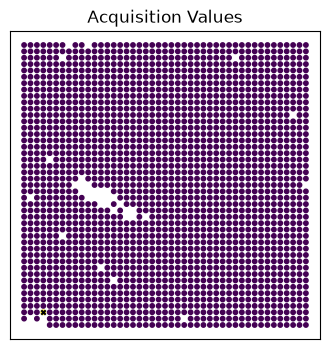

38/100


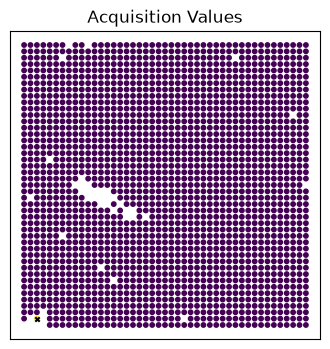

39/100


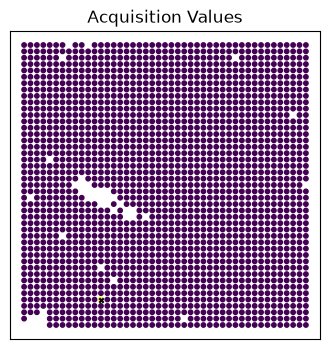

40/100


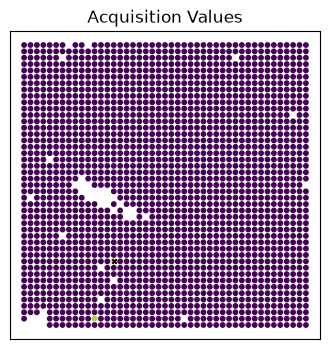

41/100


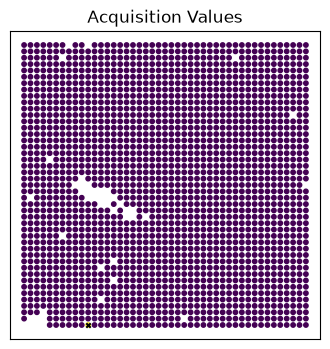

42/100


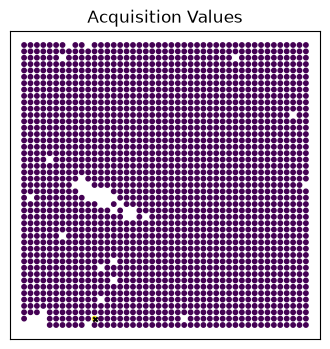

43/100


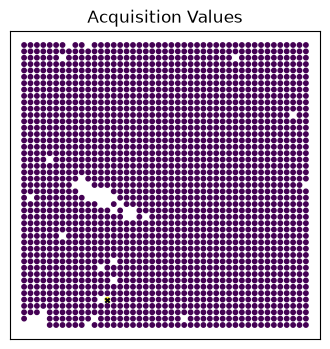

44/100


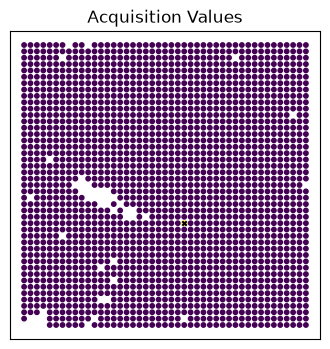

45/100


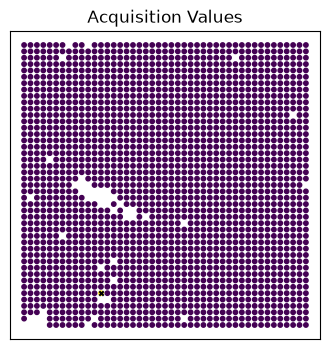

46/100


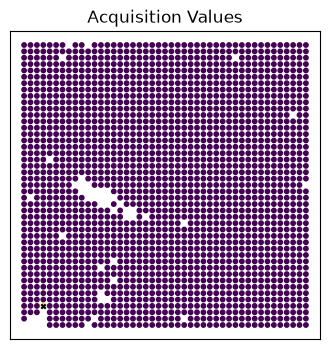

47/100


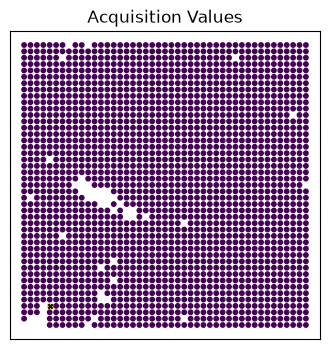

48/100


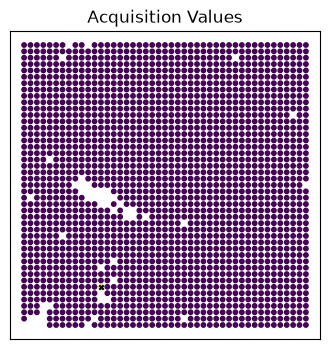

49/100


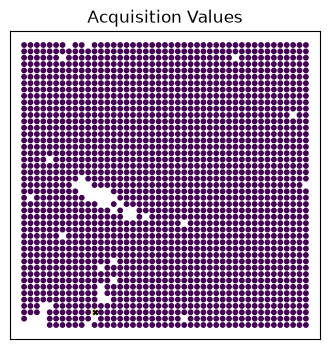

50/100


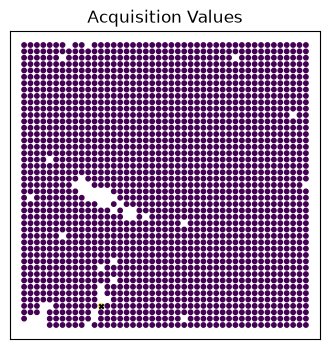

51/100


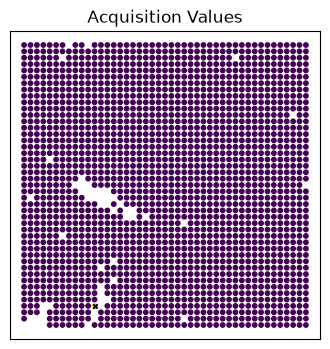

52/100


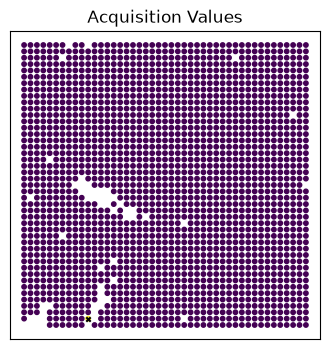

53/100


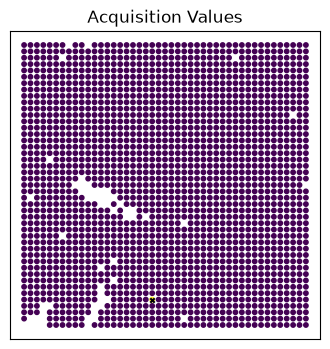

54/100


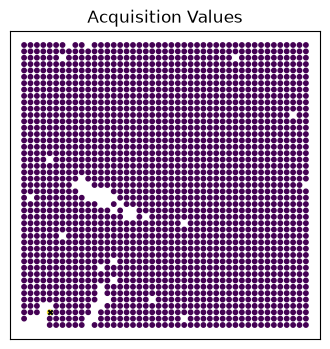

55/100


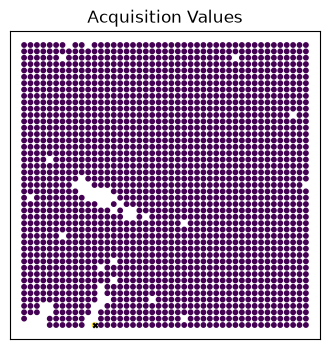

56/100


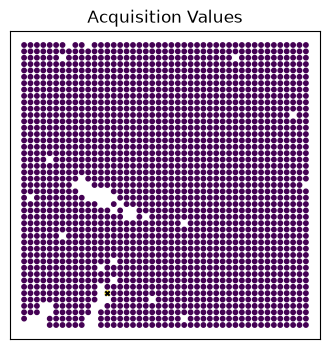

57/100


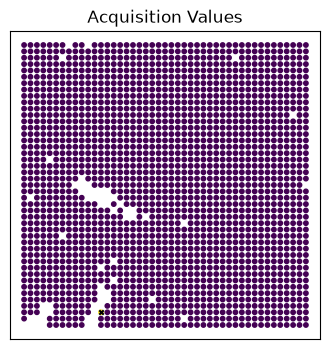

58/100


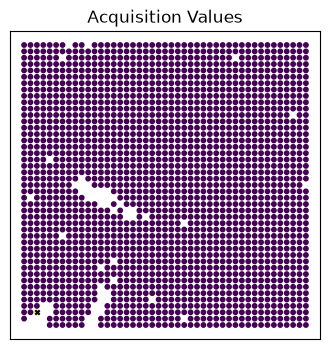

59/100


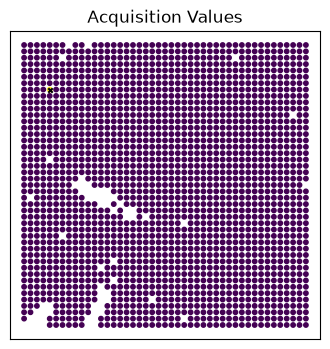

60/100


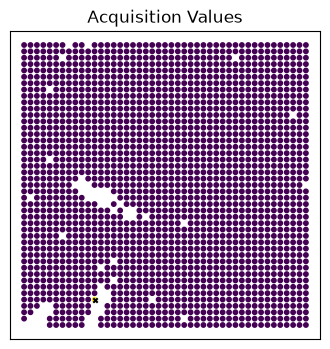

61/100


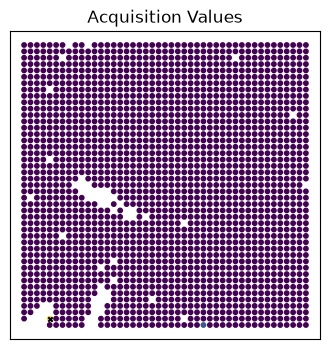

62/100


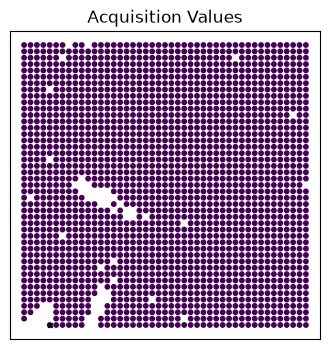

63/100


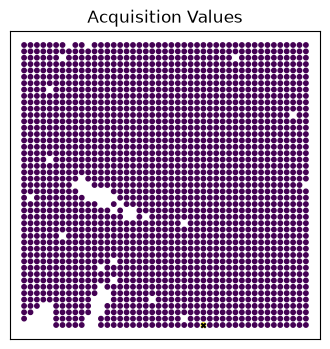

64/100


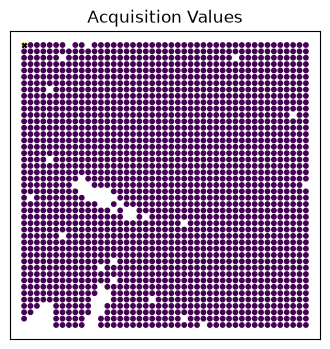

65/100


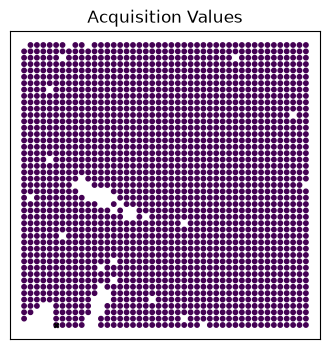

66/100


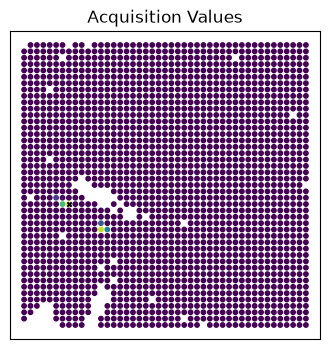

67/100


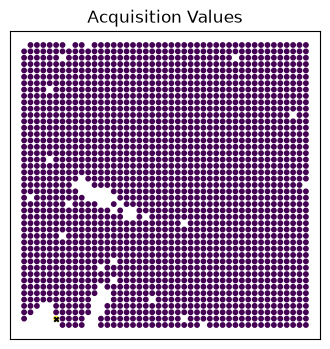

68/100


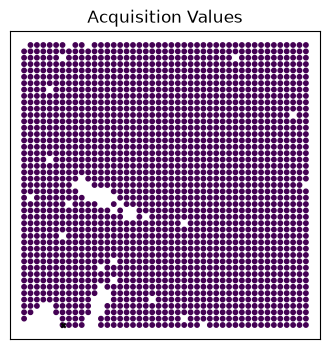

69/100


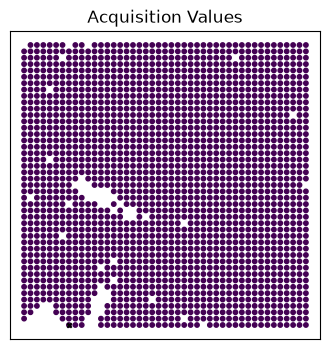

70/100


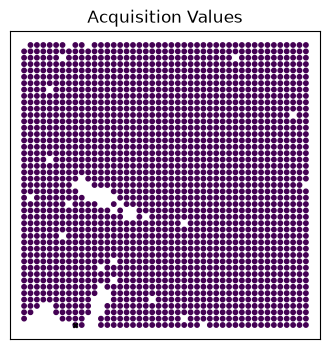

71/100


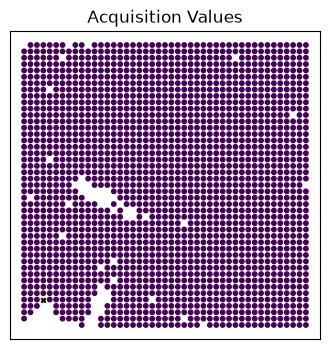

72/100


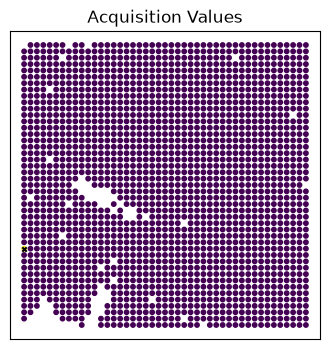

73/100


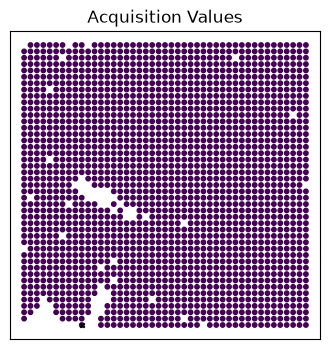

74/100


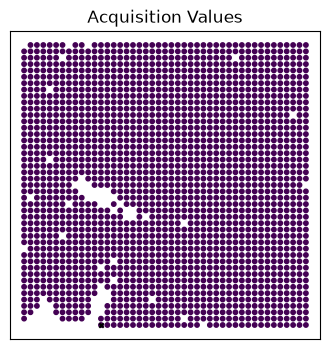

75/100


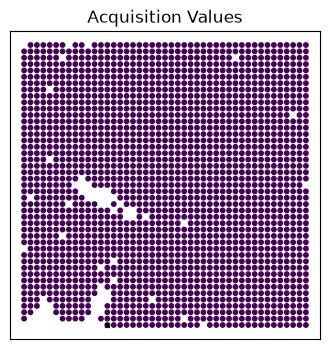

76/100


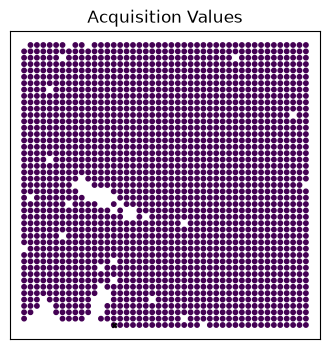

77/100


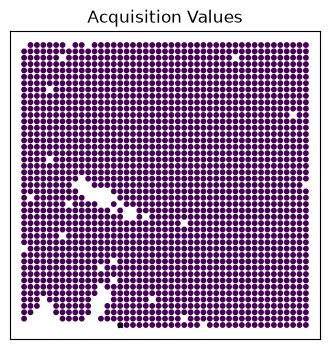

78/100


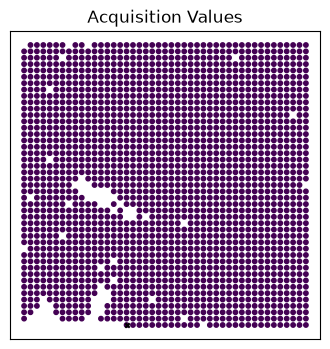

79/100


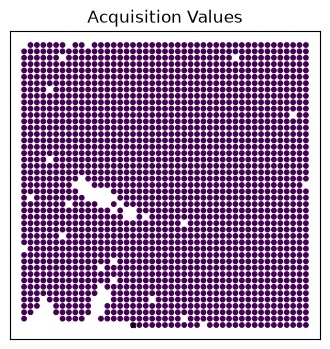

80/100


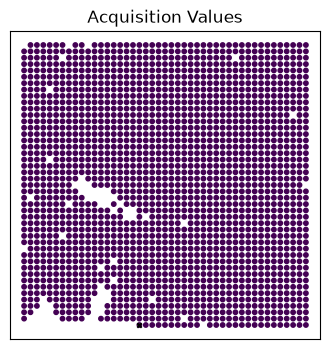

81/100


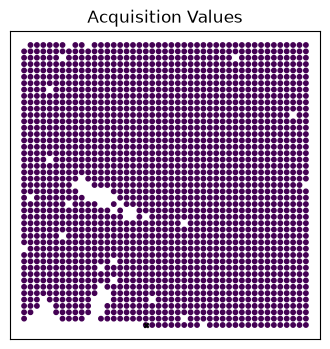

82/100


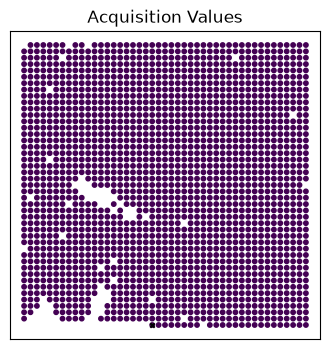

83/100


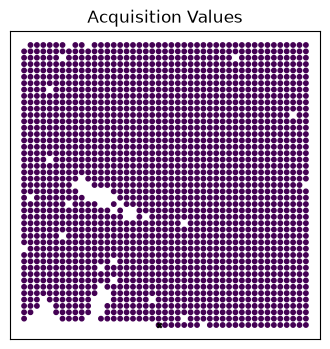

84/100


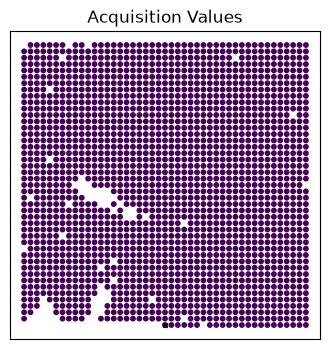

85/100


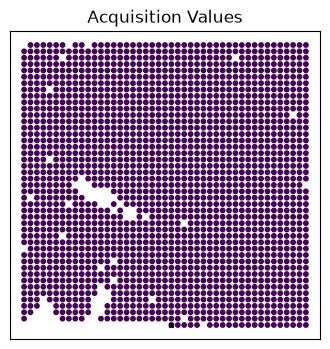

86/100


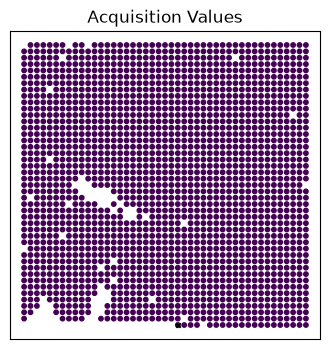

87/100


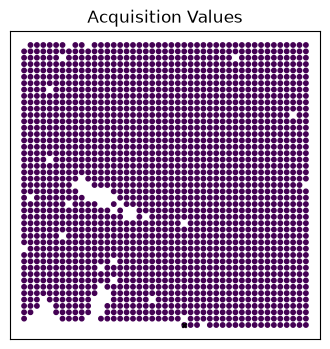

88/100


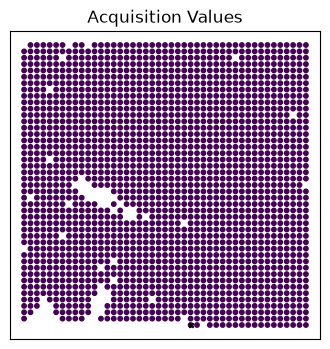

89/100


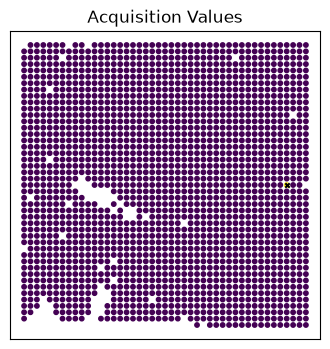

90/100


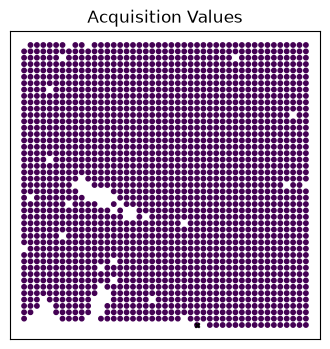

91/100


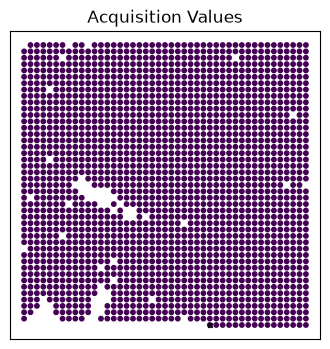

92/100


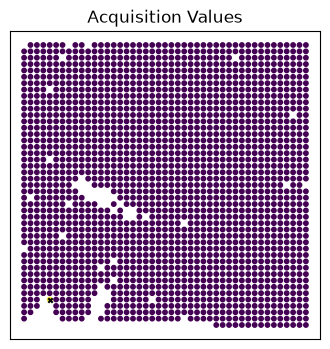

93/100


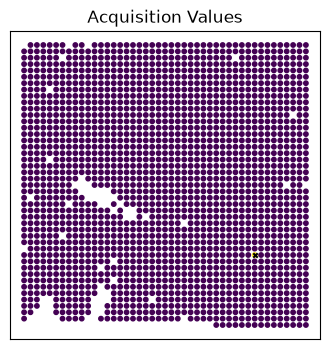

94/100


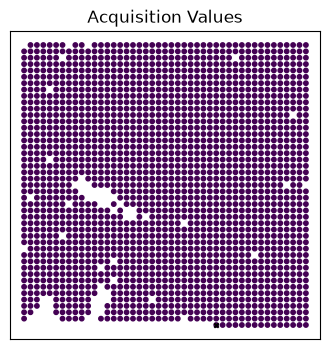

95/100


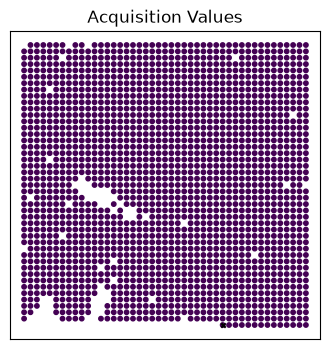

96/100


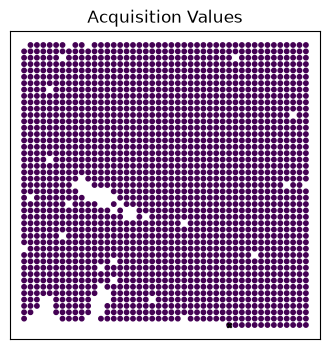

97/100


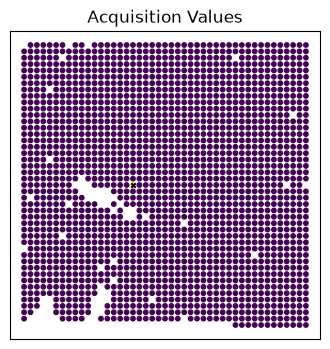

98/100


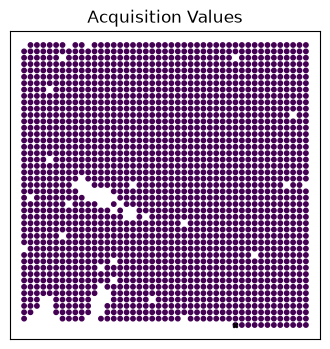

99/100


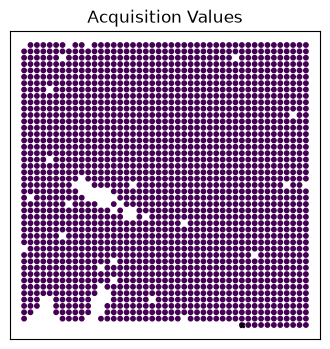

100/100


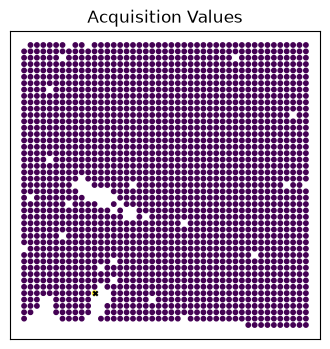

105 spectroscopy measurements performed out of 2025 possible locations


In [23]:
torch.manual_seed(42)
for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    mll, gp_model, dkl, losses = fit_dkgp(
        X_measured, norm_(y_measured),
        feature_dim=feature_dim,
        extractor_type=extractor_type,
        num_epochs=800,   # increase for more stable performance
        lr_features=1e-3,
        device=DEVICE,
        verbose=False,
    )
    # Compute acquisition function
    mean_u, std_u = dkgp_predict(dkl, X_unmeasured)
    obj = expected_improvement(mean_u, std_u, best_f=norm_(y_measured).max())
    # Select next point to measure
    next_point_idx = obj.argmax()
    next_row, next_col = indices_unmeasured[next_point_idx]
    # Do the measurement: move the tip there, acquire the loop, scalarize it
    measured_point = loop_area(measure_spectrum(next_row, next_col), v_step)
    # Plot current result
    plot_result(indices_unmeasured, obj)
    np.savez("DKL_step{}.npz".format(e), next_point_idx = next_point_idx, obj = obj, X_measured = X_measured,
             X_unmeasured = X_unmeasured, y_measured = y_measured,
             indices_measured = indices_measured, indices_unmeasured = indices_unmeasured)
    # Update the arrays of measured/unmeasured points
    X_measured = np.append(X_measured, X_unmeasured[next_point_idx][None], 0)
    X_unmeasured = np.delete(X_unmeasured, next_point_idx, 0)
    y_measured = np.append(y_measured, measured_point)
    indices_measured = np.append(indices_measured, indices_unmeasured[next_point_idx][None], 0)
    indices_unmeasured = np.delete(indices_unmeasured, next_point_idx, 0)

print(f'{len(acquisition_log)} spectroscopy measurements performed out of {len(X)} possible locations')


([], [])

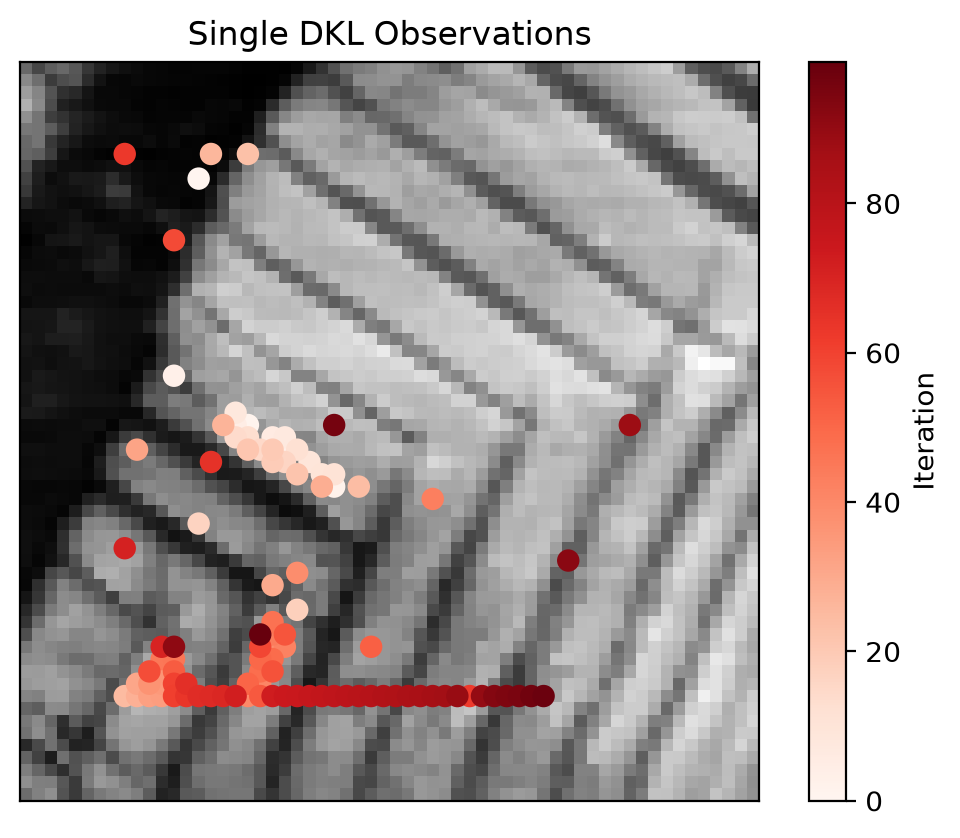

In [24]:
plt.figure(dpi = 200)
plt.imshow(img, origin="lower", cmap='gray')
plt.scatter(indices_measured[seed_points:, 1], indices_measured[seed_points:, 0],
            c=np.arange(len(indices_measured[seed_points:])), s=50, cmap="Reds")
plt.colorbar(label="Iteration")
plt.title("Single DKL Observations")
plt.xticks([])
plt.yticks([])


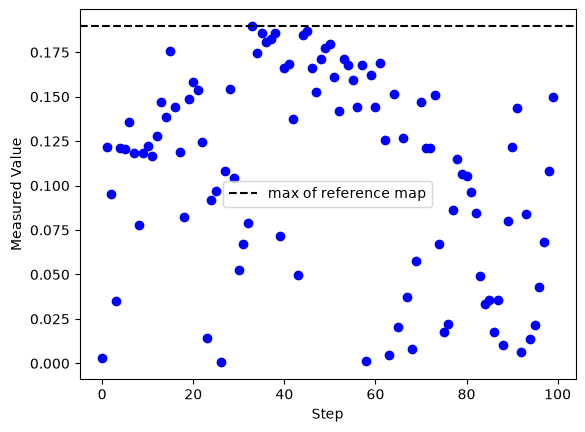

In [25]:
plt.scatter(np.arange(len(y_measured) - seed_points), y_measured[seed_points:], color = 'blue')
plt.axhline(loop_areas_ref.max(), color='k', linestyle='--', label='max of reference map')
plt.xlabel("Step")
plt.ylabel("Measured Value")
plt.legend()


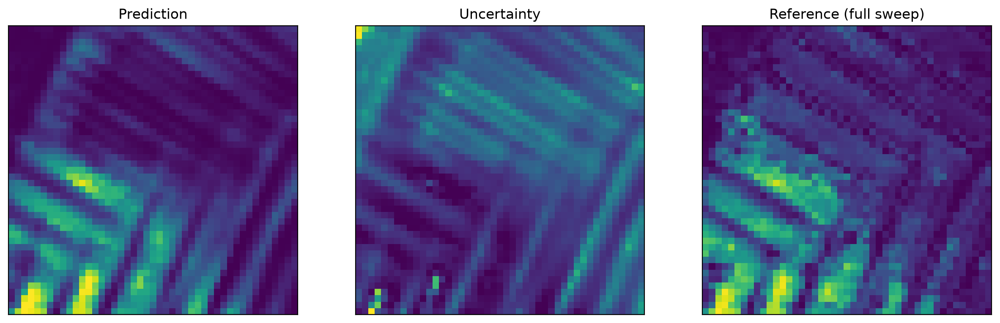

In [26]:
mean1, std1 = dkgp_predict(dkl, X)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4.5), dpi=200)
ax1.imshow(mean1.reshape(grid_shape), origin = 'lower')
ax1.set_title("Prediction")
ax2.imshow(std1.reshape(grid_shape), origin = 'lower')
ax2.set_title("Uncertainty")
ax3.imshow(loop_areas_ref.reshape(grid_shape), origin = 'lower')
ax3.set_title("Reference (full sweep)")
for _ax in fig.axes:
    _ax.set_aspect('equal')
    _ax.set_xticks([])
    _ax.set_yticks([])
